# BOOT CAMP THE BRIDGE DATA SCIENCE
# PROYECTO MACHINE LEARNING (ML) - OLIVIER KIRSTETTER - SEPTIEMBRE 2021
# NOTEBOOK

## Objectivo: análisis de datos de pozos petrolíferos - detección automática de litologías partir de registros de pozos 


###### The well log data used in this repo is licensed as Norwegian License for Open Government Data (NLOD) 2.0. “Lithofacies data was provided by the FORCE Machine Learning competition with well logs and seismic 2020”. 
###### Fuente de los datos: https://xeek.ai/challenges/force-well-logs/overview -  Se necesita suscribirse a la pagina xeek.ai

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import math

# at the top of the file, before other imports
import warnings

warnings.filterwarnings('ignore')

# no warnings will be printed from now on

In [2]:

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# plotly
# import plotly.plotly as py
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go

# word cloud library
from wordcloud import WordCloud

# matplotlib
import matplotlib.pyplot as plt
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("./"))

# Any results you write to the current directory are saved as output.

['.ipynb_checkpoints', 'data', 'ML_final.ipynb', 'ML_streamlit.py', 'model', 'RepositorioGITHUB.txt.txt']


# Funciones

### 1/ Función que transforma las coordenades UTM  de un pozo en longitud y latitud 

#### (fuente: https://stackoverflow.com/questions/343865/how-to-convert-from-utm-to-latlng-in-python-or-javascript)

In [3]:
def utmToLatLng(zone, easting, northing, northernHemisphere=True):
    
    if not northernHemisphere:
        northing = 10000000 - northing

    a = 6378137
    e = 0.081819191
    e1sq = 0.006739497
    k0 = 0.9996

    arc = northing / k0
    mu = arc / (a * (1 - math.pow(e, 2) / 4.0 - 3 * math.pow(e, 4) / 64.0 - 5 * math.pow(e, 6) / 256.0))

    ei = (1 - math.pow((1 - e * e), (1 / 2.0))) / (1 + math.pow((1 - e * e), (1 / 2.0)))

    ca = 3 * ei / 2 - 27 * math.pow(ei, 3) / 32.0

    cb = 21 * math.pow(ei, 2) / 16 - 55 * math.pow(ei, 4) / 32
    cc = 151 * math.pow(ei, 3) / 96
    cd = 1097 * math.pow(ei, 4) / 512
    phi1 = mu + ca * math.sin(2 * mu) + cb * math.sin(4 * mu) + cc * math.sin(6 * mu) + cd * math.sin(8 * mu)

    n0 = a / math.pow((1 - math.pow((e * math.sin(phi1)), 2)), (1 / 2.0))

    r0 = a * (1 - e * e) / math.pow((1 - math.pow((e * math.sin(phi1)), 2)), (3 / 2.0))
    fact1 = n0 * math.tan(phi1) / r0

    _a1 = 500000 - easting
    dd0 = _a1 / (n0 * k0)
    fact2 = dd0 * dd0 / 2

    t0 = math.pow(math.tan(phi1), 2)
    Q0 = e1sq * math.pow(math.cos(phi1), 2)
    fact3 = (5 + 3 * t0 + 10 * Q0 - 4 * Q0 * Q0 - 9 * e1sq) * math.pow(dd0, 4) / 24

    fact4 = (61 + 90 * t0 + 298 * Q0 + 45 * t0 * t0 - 252 * e1sq - 3 * Q0 * Q0) * math.pow(dd0, 6) / 720

    lof1 = _a1 / (n0 * k0)
    lof2 = (1 + 2 * t0 + Q0) * math.pow(dd0, 3) / 6.0
    lof3 = (5 - 2 * Q0 + 28 * t0 - 3 * math.pow(Q0, 2) + 8 * e1sq + 24 * math.pow(t0, 2)) * math.pow(dd0, 5) / 120
    _a2 = (lof1 - lof2 + lof3) / math.cos(phi1)
    _a3 = _a2 * 180 / math.pi

    latitude = 180 * (phi1 - fact1 * (fact2 + fact3 + fact4)) / math.pi

    if not northernHemisphere:
        latitude = -latitude

    longitude = ((zone > 0) and (6 * zone - 183.0) or 3.0) - _a3

    return (latitude, longitude)


### 2/ Función que genera un nuevo dataframe con longitud y latitud para cargar en Streamlit

In [4]:
def calc_coord(data):
    data_coord=data.loc[:,["WELL", "DEPTH_MD","X_LOC","Y_LOC"]]
    l=data_coord[data_coord["WELL"]==list(data_coord["WELL"].unique())[0]]
    all_well=l[l["DEPTH_MD"]==l["DEPTH_MD"].min()]
    lat,lon=utmToLatLng(31, all_well["X_LOC"], all_well["Y_LOC"])
    all_well["lat"]=lat
    all_well["lon"]=lon
    for i in range(1,data.WELL.nunique()):
        all_well_prov=data_coord[data_coord["WELL"]==list(data_coord["WELL"].unique())[i]]
        all_well_prov2=all_well_prov[all_well_prov["DEPTH_MD"]==all_well_prov["DEPTH_MD"].min()]
        lat,lon=utmToLatLng(31, all_well_prov2["X_LOC"], all_well_prov2["Y_LOC"])
        all_well_prov2["lat"]=lat
        all_well_prov2["lon"]=lon
        all_well=pd.concat([all_well,all_well_prov2])
        all_well.reset_index(inplace=True, drop=True)
        all_well2=all_well
        all_well2.dropna(inplace=True)
    return all_well2

### 3/ Función que genera un gráfico por pozo de los logs de profundidad (DEPTH_MD) en metros, GamaRay (GR) en API, factor de absorpcion fotoelectrica (PEF), 
### lentitud de ondas de compresion (DTC) en micros/m, densidad (Rhob) en kg/m3, porosity (NPHI), resistividad (RDEP) en Ohm.m, y lithologia.

In [5]:
def plot_logs(p):
    yb=p.iloc[0]["DEPTH_MD"]-10
    yh=p.iloc[-1]["DEPTH_MD"]+10

    x1l=p.GR.min()
    x1h=p.GR.max()
    x2l=p.PEF.min()
    x2h=p.PEF.max()
    x3l=p.DTC.min()
    x3h=p.DTC.max()
    x4l=p.RHOB.min()
    x4h=p.RHOB.max()
    x5l=p.NPHI.min()
    x5h=p.NPHI.max()
    x6l=p.RDEP.min()
    x6h=p.RDEP.max()

    fig = plt.subplots(figsize=(25,10))
    plt.suptitle(p.WELL.unique())

    ax1 = plt.subplot2grid((1,7), (0,0), rowspan=1, colspan = 1) 
    ax2 = plt.subplot2grid((1,7), (0,1), rowspan=1, colspan = 1)
    ax3 = plt.subplot2grid((1,7), (0,2), rowspan=1, colspan = 1)
    ax4 = plt.subplot2grid((1,7), (0,3), rowspan=1, colspan = 1)
    ax5 = plt.subplot2grid((1,7), (0,4), rowspan=1, colspan = 1)
    ax6 = plt.subplot2grid((1,7), (0,5), rowspan=1, colspan = 1)
    ax7 = plt.subplot2grid((1,7), (0,6), rowspan=1, colspan = 1)

    ax1.plot("GR", "DEPTH_MD", data = p, color = "green")
    ax1.set_title("Gamma Ray (API)")
    ax1.set_xlim(x1l, x1h) 
    ax1.set_ylim(yh, yb) 
    ax1.grid() 
    ax1.set_ylabel("Measured depth (m)")

    ax2.plot("PEF", "DEPTH_MD", data =p, color = "red")
    ax2.set_title("PEF")
    ax2.set_xlim(x2l, x2h)
    ax2.set_ylim(yh, yb)
    ax2.grid()

    ax3.plot("DTC", "DEPTH_MD", data = p, color = "blue")
    ax3.set_title("DTC (micros/m)")
    ax3.set_xlim(x3l, x3h)
    ax3.set_ylim(yh, yb)
    ax3.grid()

    ax4.plot("RHOB", "DEPTH_MD", data = p, color = "green")
    ax4.set_title("RHOB (kg/m3)")
    ax4.set_xlim(x4l, x4h)
    ax4.set_ylim(yh, yb)
    ax4.grid()
    
    ax5.plot("NPHI", "DEPTH_MD", data = p, color = "red")
    ax5.set_title("NPHI")
    ax5.set_xlim(x5l, x5h)
    ax5.set_ylim(yh, yb)
    ax5.grid()
    
    ax6.plot("RDEP", "DEPTH_MD", data = p, color = "blue")
    ax6.set_title("Resistivity (Ohm.m)")
    ax6.set_xlim(x6l, x6h)
    ax6.set_ylim(yh, yb)
    ax6.grid()
    
    ax7.plot("LITH_NUMBER", "DEPTH_MD", data = p, color = "black")
    ax7.set_title("LITH")
    ax7.set_xlim(0,10)
    ax7.set_ylim(yh, yb)
    ax7.grid()
    

### 4/ Función que genera un plot Plotly por pozo de sus registros pricipales para análisis interactivo

In [6]:
def plot_final(p):
    # import graph objects as "go"
    import plotly.graph_objs as go
    from plotly.subplots import make_subplots

    fig = make_subplots(rows=1, cols=8, shared_yaxes=True)


    # Creating trace1
    fig.add_trace(go.Scatter(
                        x = p['FORMATION'],
                        y = p['DEPTH_MD'],
                        name = 'FORMATION',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = ''), row=1, col=1)
    
    # Creating trace2
    fig.add_trace(go.Scatter(
                        x = p['GR'],
                        y = p['DEPTH_MD'],
                        name = 'GR',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = 'GR'), row=1, col=2)
    # Creating trace3
    fig.add_trace(go.Scatter(
                        x = p['PEF'],
                        y = p['DEPTH_MD'],
                        name = 'PEF',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = 'PEF'), row=1, col=3)
    

    # Creating trace4
    fig.add_trace(go.Scatter(
                        x = p['DTC'],
                        y = p['DEPTH_MD'],
                        name = 'DTC',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = 'DTC'), row=1, col=4)
    
    # Creating trace5
    fig.add_trace(go.Scatter(
                        x = p['RHOB'],
                        y = p['DEPTH_MD'],
                        name = 'RHOB',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = 'RHOB'), row=1, col=5)

    

    
    # Creating trace6
    fig.add_trace(go.Scatter(
                        x = p['NPHI'],
                        y = p['DEPTH_MD'],
                        name = 'NPHI',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = 'NPHI'), row=1, col=6)
    
    
    # Creating trace7
    fig.add_trace(go.Scatter(
                        x = p['RDEP'],
                        y = p['DEPTH_MD'],
                        name = 'RDEP',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = 'RDEP'), row=1, col=7)    
    
     # Creating trace8
    fig.add_trace(go.Scatter(
                        x = p['LITH'],
                        y = p['DEPTH_MD'],
                        name = 'LITH',
                        mode= 'lines',
                        marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                        text = ''), row=1, col=8) 
        


    # Create axis objects
    fig.update_layout(
            title=dict(text="WELL" +" " +p.iloc[1]["WELL"], 
            y=0.9, x=0.5, 
            xanchor= 'center',
            yanchor= 'top'),

        
            xaxis1=dict(title="",
            titlefont=dict(color="#1f77b4"),
            domain=[0.02, 0.12], nticks=3),
        
            xaxis2=dict(title="GR",
            titlefont=dict(color="#1f77b4"),
            domain=[0.14,0.24], nticks=3),

            xaxis3=dict(title="PEF",
            titlefont=dict(color="#1f77b4"),
            domain=[0.26, 0.36], nticks=3),

            xaxis4=dict(title="DTC",
            titlefont=dict(color="#1f77b4"),
            domain=[0.38, 0.48], nticks=3),
        
            xaxis5=dict(title="RHOB",
            titlefont=dict(color="#1f77b4"),
            domain=[0.50, 0.60], nticks=3),
        
            xaxis6=dict(title="NPHI",
            titlefont=dict(color="#1f77b4"),
            domain=[0.62, 0.72], nticks=3),
        
            xaxis7=dict(title="RDEP",
            titlefont=dict(color="#1f77b4"),
            domain=[0.74, 0.84], nticks=3),
        
        
            xaxis8=dict(title="",
            titlefont=dict(color="#1f77b4"),
            domain=[0.86, 0.96], nticks=3),


        yaxis1=dict(
            title="Measured depth (m)",
            titlefont=dict(color="#1f77b4"),
            tickfont=dict(color="#1f77b4"),
            anchor="free",
            overlaying="y",
            side="left",
            range=[p["DEPTH_MD"].max(), p["DEPTH_MD"].min()],
            position=0.01, nticks=10),
    )

    fig.show()

### 5/ Función de calculo del error ponderado a partir de la matriz A dada por los organizdores del reto (fuente: https://xeek.ai/challenges/force-well-logs/overview)
### Lo mas cerca de 0 este puntaje lo más preciso el modelo

In [7]:
A = np.load('./data/raw/penalty_matrix.npy')
def score(y_true, y_pred):
    S = 0.0
    y_true = y_true.astype(int)
    y_pred = y_pred.astype(int)
    for i in range(0, y_true.shape[0]):
        S -= A[y_true[i], y_pred[i]]
    return S/y_true.shape[0]

# Código principal

## 1/ Carga de datos (entrenamiento y testeo)

In [8]:
data=pd.read_csv(r"./data/raw/train.csv", sep=";")

In [9]:
data["GROUP"].unique()

array(['NORDLAND GP.', 'HORDALAND GP.', 'ROGALAND GP.', 'SHETLAND GP.',
       'CROMER KNOLL GP.', 'VIKING GP.', 'VESTLAND GP.', 'ZECHSTEIN GP.',
       'HEGRE GP.', 'ROTLIEGENDES GP.', 'TYNE GP.', 'BOKNFJORD GP.',
       'DUNLIN GP.', 'BAAT GP.', nan], dtype=object)

In [10]:
data["FORMATION"].unique()

array([nan, 'Utsira Fm.', 'Balder Fm.', 'Sele Fm.', 'Lista Fm.',
       'Heimdal Fm.', 'Tor Fm.', 'Hod Fm.', 'Blodoeks Fm.', 'Svarte Fm.',
       'Roedby Fm.', 'Sola Fm.', 'Aasgard Fm.', 'Draupne Fm.',
       'Heather Fm.', 'Hugin Fm.', 'Smith Bank Fm.', 'Frigg Fm.',
       'Skagerrak Fm.', 'Ekofisk Fm.', 'Kupferschiefer Fm.', 'Skade Fm.',
       'Grid Fm.', 'Vaale Fm.', 'Sleipner Fm.', 'Hidra Fm.', 'Tuxen Fm.',
       'Mandal Fm.', 'Ula Fm.', 'Bryne Fm.', 'Tau Fm.', 'Sandnes Fm.',
       'Intra Draupne Fm. Sst.', 'Statfjord Fm.', 'Skade Mb.', 'BASEMENT',
       'Ran Sst Mb.', 'Flekkefjord Fm.', 'Sauda Fm.', 'Egersund Fm.',
       'Intra Balder Fm. Sst.', 'Hermod Mb.', 'Ty Fm.', 'Hardraade Fm.',
       'Kyrre Fm.', 'Tryggvason Fm.', 'Drake Fm.', 'Cook Fm.',
       'Amundsen Fm.', 'Grid Mb.', 'Ty Mb.', 'Jorsalfare Fm.',
       'Burton Fm.', 'Mime Fm.', 'Intra Heather Fm. Sst.', 'Tarbert Fm.',
       'Ness Fm.', 'Etive Fm.', 'Rannoch Fm.', 'Broom Fm.', 'Lunde Fm.',
       'Oseberg Fm.', 

In [11]:
data.shape

(1170511, 29)

In [12]:
data.head(100)

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.611410,...,34.636410,NaN,NaN,-0.574928,NaN,NaN,NaN,NaN,65000,1.0
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.618070,...,34.636410,NaN,NaN,-0.570188,NaN,NaN,NaN,NaN,65000,1.0
2,15/9-13,494.832,437641.96875,6470972.5,-469.805786,NORDLAND GP.,NaN,19.468800,NaN,1.626459,...,34.779556,NaN,NaN,-0.574245,NaN,NaN,NaN,NaN,65000,1.0
3,15/9-13,494.984,437641.96875,6470972.5,-469.957794,NORDLAND GP.,NaN,19.459282,NaN,1.621594,...,39.965164,NaN,NaN,-0.586315,NaN,NaN,NaN,NaN,65000,1.0
4,15/9-13,495.136,437641.96875,6470972.5,-470.109772,NORDLAND GP.,NaN,19.453100,NaN,1.602679,...,57.483765,NaN,NaN,-0.597914,NaN,NaN,NaN,NaN,65000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,15/9-13,508.968,437642.03125,6470972.5,-483.941498,NORDLAND GP.,NaN,23.265600,NaN,1.197358,...,47.225632,NaN,NaN,-0.012441,NaN,NaN,NaN,NaN,65000,1.0
96,15/9-13,509.120,437642.03125,6470972.5,-484.093506,NORDLAND GP.,NaN,23.265600,NaN,1.199200,...,74.537460,NaN,NaN,-0.015325,NaN,NaN,NaN,NaN,65000,1.0
97,15/9-13,509.272,437642.03125,6470972.5,-484.245514,NORDLAND GP.,NaN,23.265600,NaN,1.201322,...,74.612862,NaN,NaN,-0.015737,NaN,NaN,NaN,NaN,65000,1.0
98,15/9-13,509.424,437642.06250,6470972.5,-484.397522,NORDLAND GP.,NaN,23.265600,NaN,1.197425,...,75.061607,NaN,NaN,-0.015414,NaN,NaN,NaN,NaN,30000,1.0


In [13]:
data.columns

Index(['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'GROUP', 'FORMATION',
       'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'SGR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DTS', 'DCAL', 'DRHO', 'MUDWEIGHT', 'RMIC',
       'ROPA', 'RXO', 'FORCE_2020_LITHOFACIES_LITHOLOGY',
       'FORCE_2020_LITHOFACIES_CONFIDENCE'],
      dtype='object')

In [14]:
data.WELL.unique()

array(['15/9-13', '15/9-15', '15/9-17', '16/1-2', '16/1-6 A', '16/10-1',
       '16/10-2', '16/10-3', '16/10-5', '16/11-1 ST3', '16/2-11 A',
       '16/2-16', '16/2-6', '16/4-1', '16/5-3', '16/7-4', '16/7-5',
       '16/8-1', '17/11-1', '25/11-15', '25/11-19 S', '25/11-5',
       '25/2-13 T4', '25/2-14', '25/2-7', '25/3-1', '25/4-5', '25/5-1',
       '25/5-4', '25/6-1', '25/6-2', '25/6-3', '25/7-2', '25/8-5 S',
       '25/8-7', '25/9-1', '26/4-1', '29/6-1', '30/3-3', '30/3-5 S',
       '30/6-5', '31/2-1', '31/2-19 S', '31/2-7', '31/2-8', '31/2-9',
       '31/3-1', '31/3-2', '31/3-3', '31/3-4', '31/4-10', '31/4-5',
       '31/5-4 S', '31/6-5', '31/6-8', '32/2-1', '33/5-2', '33/6-3 S',
       '33/9-1', '33/9-17', '34/10-19', '34/10-21', '34/10-33',
       '34/10-35', '34/11-1', '34/11-2 S', '34/12-1', '34/2-4',
       '34/3-1 A', '34/4-10 R', '34/5-1 A', '34/5-1 S', '34/7-13',
       '34/7-20', '34/7-21', '34/8-1', '34/8-3', '34/8-7 R', '35/11-1',
       '35/11-10', '35/11-11', '35/11-12

In [15]:
list_all_wells=data.WELL.unique()

## 2/ Generación de las litologias a partir de los índices de litología presentes en el dataframe de los pozos (fuente: xeek.ai)
## Transformación de los indices de litologias por valores de 1 a 12

In [16]:

lithology_numbers = {30000: 'Sandstone',
                 65030: 'Sandstone/Shale',
                 65000: 'Shale',
                 80000: 'Marl',
                 74000: 'Dolomite',
                 70000: 'Limestone',
                 70032: 'Chalk',
                 88000: 'Halite',
                 86000: 'Anhydrite',
                 99000: 'Tuff',
                 90000: 'Coal',
                 93000: 'Basement'}


lithology_numbers2 = {'Sandstone':1,
                'Sandstone/Shale':2,
                'Shale':3,
                'Marl':4,
                'Dolomite':5,
                'Limestone':6,
                'Chalk':7,
                'Halite':8,
                'Anhydrite':9,
                'Tuff':10,
                'Coal':11,
                'Basement':12}
                

In [17]:
lithology_keys = {1: 'Sandstone',
                 2: 'Sandstone/Shale',
                 3: 'Shale',
                 4: 'Marl',
                 5: 'Dolomite',
                 6: 'Limestone',
                 7: 'Chalk',
                 8: 'Halite',
                 9: 'Anhydrite',
                 10: 'Tuff',
                 11: 'Coal',
                 12: 'Basement'}

In [18]:
data['LITH'] = data['FORCE_2020_LITHOFACIES_LITHOLOGY'].map(lithology_numbers)
data.columns

Index(['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'GROUP', 'FORMATION',
       'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'SGR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DTS', 'DCAL', 'DRHO', 'MUDWEIGHT', 'RMIC',
       'ROPA', 'RXO', 'FORCE_2020_LITHOFACIES_LITHOLOGY',
       'FORCE_2020_LITHOFACIES_CONFIDENCE', 'LITH'],
      dtype='object')

In [19]:
data['LITH_NUMBER'] = data['LITH'].map(lithology_numbers2)
data.columns

Index(['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'GROUP', 'FORMATION',
       'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'SGR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DTS', 'DCAL', 'DRHO', 'MUDWEIGHT', 'RMIC',
       'ROPA', 'RXO', 'FORCE_2020_LITHOFACIES_LITHOLOGY',
       'FORCE_2020_LITHOFACIES_CONFIDENCE', 'LITH', 'LITH_NUMBER'],
      dtype='object')

In [20]:
data.rename({'FORCE_2020_LITHOFACIES_LITHOLOGY':'LITH_number'}, axis=1, inplace=True)

In [21]:
data.rename({'FORCE_2020_LITHOFACIES_CONFIDENCE':'LITH_conf'}, axis=1, inplace=True)

In [22]:
data.head(10)

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,...,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,LITH_number,LITH_conf,LITH,LITH_NUMBER
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.611410,...,NaN,-0.574928,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.618070,...,NaN,-0.570188,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
2,15/9-13,494.832,437641.96875,6470972.5,-469.805786,NORDLAND GP.,NaN,19.468800,NaN,1.626459,...,NaN,-0.574245,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
3,15/9-13,494.984,437641.96875,6470972.5,-469.957794,NORDLAND GP.,NaN,19.459282,NaN,1.621594,...,NaN,-0.586315,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
4,15/9-13,495.136,437641.96875,6470972.5,-470.109772,NORDLAND GP.,NaN,19.453100,NaN,1.602679,...,NaN,-0.597914,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
5,15/9-13,495.288,437641.96875,6470972.5,-470.261780,NORDLAND GP.,NaN,19.453100,NaN,1.585567,...,NaN,-0.601600,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
6,15/9-13,495.440,437641.96875,6470972.5,-470.413788,NORDLAND GP.,NaN,19.462496,NaN,1.576569,...,NaN,-0.598369,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
7,15/9-13,495.592,437641.96875,6470972.5,-470.565796,NORDLAND GP.,NaN,19.468800,NaN,1.587011,...,NaN,-0.602039,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
8,15/9-13,495.744,437641.96875,6470972.5,-470.717773,NORDLAND GP.,NaN,19.468800,NaN,1.613674,...,NaN,-0.614364,NaN,NaN,NaN,NaN,65000,1.0,Shale,3
9,15/9-13,495.896,437641.96875,6470972.5,-470.869781,NORDLAND GP.,NaN,19.468800,NaN,1.634622,...,NaN,-0.621813,NaN,NaN,NaN,NaN,65000,1.0,Shale,3


## 3/ EDA datos de entrenamiento y testeo

### Aanálisis de la distribución de las 12 litologías en los pozos  

['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/1-6 A' '16/10-1' '16/10-2'
 '16/10-3' '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1'
 '16/5-3' '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S'
 '25/11-5' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1'
 '25/5-4' '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1'
 '26/4-1' '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S'
 '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10'
 '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S'
 '33/9-1' '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-13' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R'
 '35/11-1' '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S'
 '35/11-6' '35/11-7' '35/12-1' '35/3-7 S' '35/4-1' '35/8-4' '35/8-6 S'
 '35/9-10 S' '35/9-2' '35/9-5' '35/9-6 S' '36/7-3' '7/1-1' '7/1-2 S']
(117051

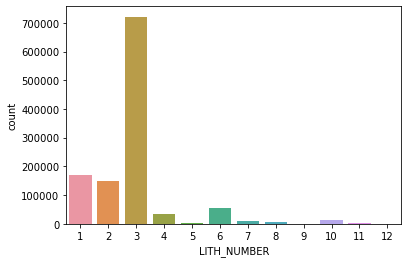

In [23]:
listdata1=data[data["LITH_NUMBER"]==1].WELL.unique()
print(listdata1)
data1=data[data["WELL"].isin(listdata1)]
print(data1.shape)
sns.countplot(x = 'LITH_NUMBER', data=data1);

['15/9-13' '15/9-15' '15/9-17' '16/1-6 A' '16/10-1' '16/10-2' '16/10-3'
 '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1' '16/5-3'
 '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S' '25/11-5'
 '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1' '25/5-4'
 '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1' '26/4-1'
 '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S' '31/2-7'
 '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10' '31/4-5'
 '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S' '33/9-1'
 '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-13' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R'
 '35/11-1' '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S'
 '35/11-6' '35/11-7' '35/12-1' '35/3-7 S' '35/4-1' '35/8-4' '35/8-6 S'
 '35/9-10 S' '35/9-2' '35/9-5' '35/9-6 S' '36/7-3' '7/1-1' '7/1-2 S']
(1168777, 31)


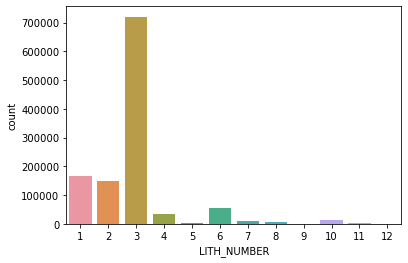

In [24]:
listdata2=data[data["LITH_NUMBER"]==2].WELL.unique()
print(listdata2)
data2=data[data["WELL"].isin(listdata2)]
print(data2.shape)
sns.countplot(x = 'LITH_NUMBER', data=data2);

['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/1-6 A' '16/10-1' '16/10-2'
 '16/10-3' '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1'
 '16/5-3' '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S'
 '25/11-5' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1'
 '25/5-4' '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1'
 '26/4-1' '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S'
 '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10'
 '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S'
 '33/9-1' '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-13' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R'
 '35/11-1' '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S'
 '35/11-6' '35/11-7' '35/12-1' '35/3-7 S' '35/4-1' '35/8-4' '35/8-6 S'
 '35/9-10 S' '35/9-2' '35/9-5' '35/9-6 S' '36/7-3' '7/1-1' '7/1-2 S']
(117051

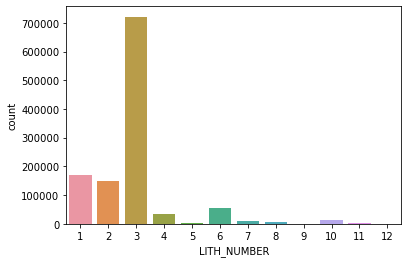

In [25]:
listdata3=data[data["LITH_NUMBER"]==3].WELL.unique()
print(listdata3)
data3=data[data["WELL"].isin(listdata3)]
print(data3.shape)
sns.countplot(x = 'LITH_NUMBER', data=data3);

['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/10-1' '16/10-2' '16/10-3'
 '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1' '16/5-3'
 '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-5' '25/2-13 T4'
 '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1' '25/5-4' '25/6-1' '25/6-2'
 '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1' '26/4-1' '30/6-5' '31/2-1'
 '31/2-19 S' '31/2-7' '31/2-8' '31/3-1' '31/3-2' '31/3-3' '31/3-4'
 '31/4-10' '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '33/5-2' '33/9-1'
 '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A' '34/7-13'
 '34/7-20' '34/7-21' '34/8-3' '34/8-7 R' '35/11-10' '35/11-11' '35/12-1'
 '35/9-2' '35/9-5' '7/1-1']
(913632, 31)


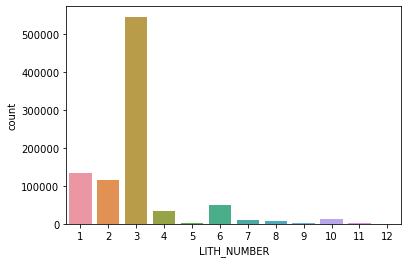

In [26]:
listdata4=data[data["LITH_NUMBER"]==4].WELL.unique()
print(listdata4)
data4=data[data["WELL"].isin(listdata4)]
print(data4.shape)
sns.countplot(x = 'LITH_NUMBER', data=data4);

['15/9-13' '15/9-17' '16/1-2' '16/10-1' '16/11-1 ST3' '16/2-6' '16/4-1'
 '16/8-1' '17/11-1' '25/2-7' '25/3-1' '25/5-1' '25/8-5 S' '25/8-7'
 '25/9-1' '26/4-1' '29/6-1' '30/3-3' '30/6-5' '31/2-8' '31/4-5' '33/9-1'
 '33/9-17' '34/10-19' '34/10-21' '34/10-35' '34/11-2 S' '34/2-4'
 '34/4-10 R' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '35/11-11' '35/11-12'
 '35/11-6' '35/4-1']
(617781, 31)


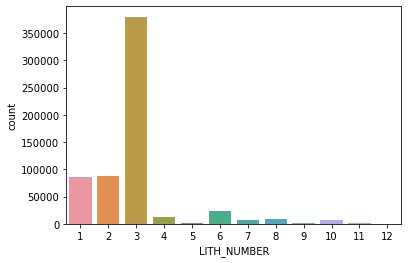

In [27]:
listdata5=data[data["LITH_NUMBER"]==5].WELL.unique()
print(listdata5)
data5=data[data["WELL"].isin(listdata5)]
print(data5.shape)
sns.countplot(x = 'LITH_NUMBER', data=data5);

['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/1-6 A' '16/10-1' '16/10-2'
 '16/10-3' '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1'
 '16/5-3' '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S'
 '25/11-5' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1'
 '25/5-4' '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1'
 '26/4-1' '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S'
 '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10'
 '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S'
 '33/9-1' '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R' '35/11-1'
 '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S' '35/11-6'
 '35/11-7' '35/12-1' '35/4-1' '35/8-4' '35/8-6 S' '35/9-10 S' '35/9-2'
 '35/9-5' '35/9-6 S' '36/7-3' '7/1-1']
(1155258, 31)


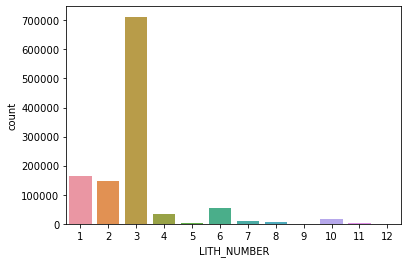

In [28]:
listdata6=data[data["LITH_NUMBER"]==6].WELL.unique()
print(listdata6)
data6=data[data["WELL"].isin(listdata6)]
print(data6.shape)
sns.countplot(x = 'LITH_NUMBER', data=data6);

['15/9-15' '16/10-1' '16/10-2' '16/10-3' '16/10-5' '16/11-1 ST3' '16/5-3'
 '16/8-1' '17/11-1' '25/11-5' '7/1-1']
(122594, 31)


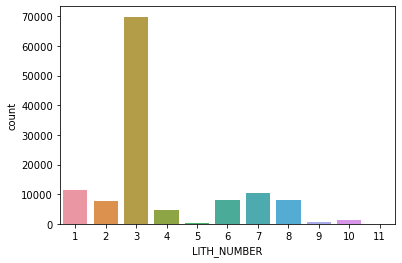

In [29]:
listdata7=data[data["LITH_NUMBER"]==7].WELL.unique()
print(listdata7)
data7=data[data["WELL"].isin(listdata7)]
print(data7.shape)
sns.countplot(x = 'LITH_NUMBER', data=data7);

['16/10-1' '16/11-1 ST3' '17/11-1']
(52712, 31)


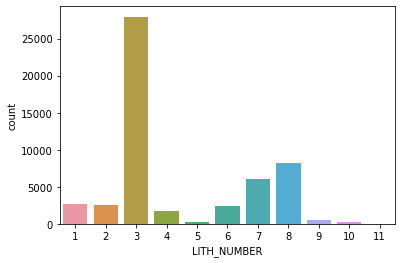

In [30]:
listdata8=data[data["LITH_NUMBER"]==8].WELL.unique()
print(listdata8)
data8=data[data["WELL"].isin(listdata8)]
print(data8.shape)
sns.countplot(x = 'LITH_NUMBER', data=data8);

['15/9-13' '16/11-1 ST3' '16/2-16' '16/4-1' '17/11-1' '34/10-35']
(98033, 31)


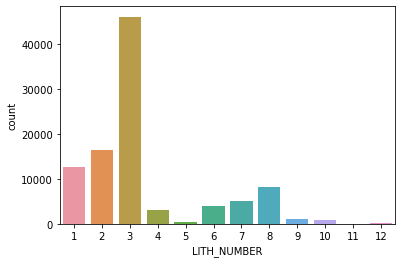

In [31]:
listdata9=data[data["LITH_NUMBER"]==9].WELL.unique()
print(listdata9)
data9=data[data["WELL"].isin(listdata9)]
print(data9.shape)
sns.countplot(x = 'LITH_NUMBER', data=data9);

['15/9-13' '15/9-15' '15/9-17' '16/10-1' '16/10-3' '16/11-1 ST3'
 '16/2-11 A' '16/2-16' '16/2-6' '16/4-1' '16/7-4' '16/7-5' '16/8-1'
 '25/11-19 S' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1' '25/5-4'
 '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1' '26/4-1' '30/3-3' '30/6-5'
 '31/2-1' '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-3' '31/4-10' '31/4-5'
 '31/5-4 S' '31/6-5' '31/6-8' '33/9-1' '33/9-17' '34/10-19' '34/10-21'
 '34/10-35' '34/11-2 S' '34/2-4' '34/7-20' '34/7-21' '34/8-1' '34/8-3'
 '35/11-1' '35/11-12' '35/11-6' '35/4-1' '7/1-1']
(851731, 31)


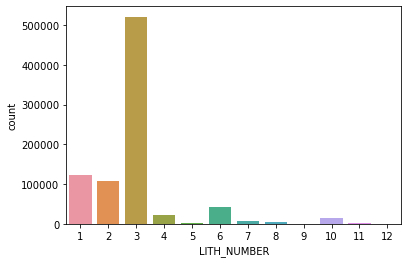

In [32]:
listdata10=data[data["LITH_NUMBER"]==10].WELL.unique()
print(listdata10)
data10=data[data["WELL"].isin(listdata10)]
print(data10.shape)
sns.countplot(x = 'LITH_NUMBER', data=data10);

['16/10-1' '16/10-3' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5'
 '25/5-1' '25/5-4' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1' '26/4-1' '29/6-1'
 '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S' '31/2-8' '31/3-1'
 '31/3-2' '31/3-3' '31/3-4' '31/4-5' '31/6-5' '31/6-8' '33/9-1' '33/9-17'
 '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1' '34/11-2 S'
 '34/12-1' '34/3-1 A' '34/5-1 S' '34/7-20' '34/7-21' '34/8-3' '35/11-1'
 '35/11-10' '35/11-11' '35/11-15 S' '35/11-6' '35/11-7' '35/9-2' '35/9-5'
 '35/9-6 S']
(725742, 31)


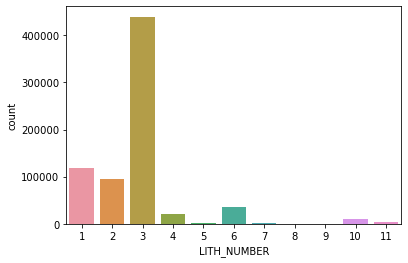

In [33]:
listdata11=data[data["LITH_NUMBER"]==11].WELL.unique()
print(listdata11)
data11=data[data["WELL"].isin(listdata11)]
print(data11.shape)
sns.countplot(x = 'LITH_NUMBER', data=data11);

['16/4-1']
(14082, 31)


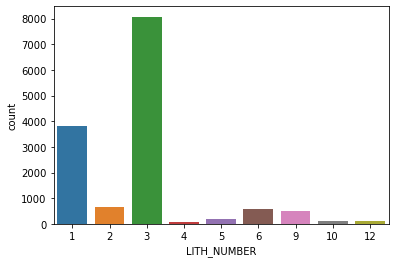

In [34]:
listdata12=data[data["LITH_NUMBER"]==12].WELL.unique()
print(listdata12)
data12=data[data["WELL"].isin(listdata12)]
print(data12.shape)
sns.countplot(x = 'LITH_NUMBER', data=data12);

In [35]:
data["Z_LOC"]=data["Z_LOC"]*(-1)

In [36]:
data.columns

Index(['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'GROUP', 'FORMATION',
       'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'SGR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DTS', 'DCAL', 'DRHO', 'MUDWEIGHT', 'RMIC',
       'ROPA', 'RXO', 'LITH_number', 'LITH_conf', 'LITH', 'LITH_NUMBER'],
      dtype='object')

In [37]:
data['LITH_NUMBER'].value_counts()

3     720803
1     168937
2     150455
6      56320
4      33329
10     15245
7      10513
8       8213
11      3820
5       1688
9       1085
12       103
Name: LITH_NUMBER, dtype: int64

In [38]:
dataSEL1=data[~data['WELL'].isin(listdata12)]

(1156429, 31)


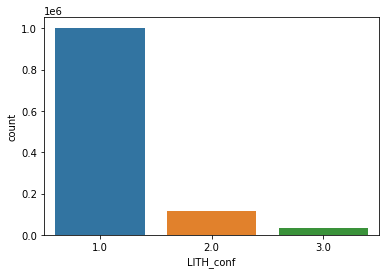

In [39]:
print(dataSEL1.shape)
sns.countplot(x = 'LITH_conf', data=dataSEL1);

(1156429, 31)


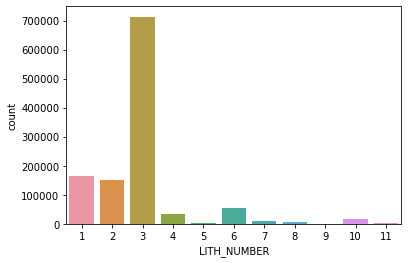

In [40]:
print(dataSEL1.shape)
sns.countplot(x = 'LITH_NUMBER', data=dataSEL1);

In [41]:
dataSEL1['LITH_NUMBER'].nunique()

11

In [42]:
dataSEL1['LITH_NUMBER'].value_counts(normalize=True).round(2)

3     0.62
1     0.14
2     0.13
6     0.05
4     0.03
10    0.01
7     0.01
8     0.01
11    0.00
5     0.00
9     0.00
Name: LITH_NUMBER, dtype: float64

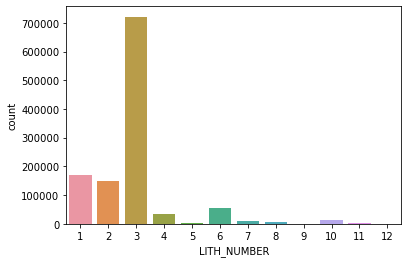

In [43]:
sns.countplot(x = 'LITH_NUMBER', data=data);

In [44]:
data['LITH_NUMBER'].nunique()

12

In [45]:
data['LITH_NUMBER'].value_counts(normalize=True).round(2)

3     0.62
1     0.14
2     0.13
6     0.05
4     0.03
10    0.01
7     0.01
8     0.01
11    0.00
5     0.00
9     0.00
12    0.00
Name: LITH_NUMBER, dtype: float64

### Analisis de la presencia de missing

In [46]:
precent_missing = round(dataSEL1.isnull().sum()*100/len(dataSEL1),2)
missing_value_data= pd.DataFrame({'column_name': dataSEL1.columns,
                                'percent_missing': precent_missing}).sort_values('percent_missing', ascending=False)
missing_value_data

,column_name,percent_missing
SGR,SGR,94.00
DTS,DTS,84.90
RMIC,RMIC,84.77
ROPA,ROPA,83.37
DCAL,DCAL,75.38
MUDWEIGHT,MUDWEIGHT,73.88
RXO,RXO,72.07
ROP,ROP,54.95
RSHA,RSHA,46.54
BS,BS,42.19


## 4/ Selección de los datos de feature para el modelo + QC

In [47]:
datas1=dataSEL1[["DEPTH_MD",'PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC', "LITH_NUMBER"]]

In [48]:
datas1

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC,LITH_NUMBER
0,494.5280,20.915468,1.798681,1.884186,80.200851,NaN,161.131180,3
1,494.6800,19.383013,1.795641,1.889794,79.262886,NaN,160.603470,3
2,494.8320,22.591518,1.800733,1.896523,74.821999,NaN,160.173615,3
3,494.9840,32.191910,1.801517,1.891913,72.878922,NaN,160.149429,3
4,495.1360,38.495632,1.795299,1.880034,71.729141,NaN,160.128342,3
...,...,...,...,...,...,...,...,...
1170506,3169.3124,4.586425,NaN,2.527984,77.654900,NaN,NaN,1
1170507,3169.4644,7.019858,NaN,2.537613,75.363937,NaN,NaN,2
1170508,3169.6164,9.049782,NaN,2.491860,66.452843,NaN,NaN,2
1170509,3169.7684,8.903917,NaN,2.447539,55.784817,NaN,NaN,2


In [49]:
datas1.columns

Index(['DEPTH_MD', 'PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC', 'LITH_NUMBER'], dtype='object')

### Analisis de la distribución de los features

p-value Shapiro test Original:  0.0
p-value Shapiro test Logaritmic:  0.0
p-value Shapiro test Box-cox:  0.0


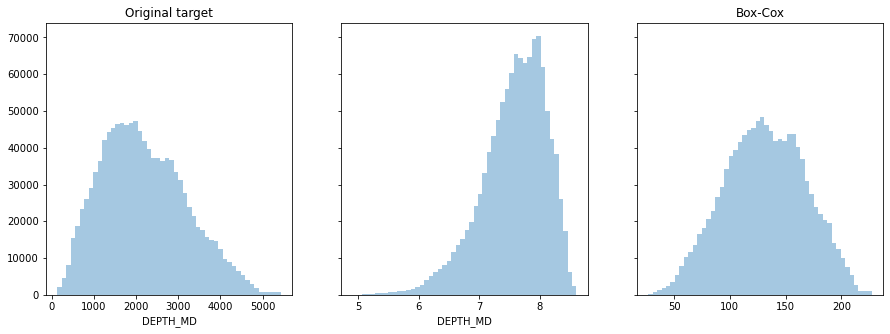

In [50]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
from scipy.stats import shapiro

from scipy.stats import skew
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

i=datas1.DEPTH_MD
# Original target
print("p-value Shapiro test Original: ", shapiro(i).pvalue)
sns.distplot(i, kde=False, ax=axes[0])
axes[0].set_title("Original target")

# Logaritmic
print("p-value Shapiro test Logaritmic: ", shapiro(np.log(i),).pvalue)
sns.distplot(np.log(i),kde=False, ax=axes[1])
#axes[1].set_title("Log" + '\np-value Shapiro ' + str(shapiro_test))

# Box-cox
print("p-value Shapiro test Box-cox: ", shapiro(stats.boxcox(i)[0]).pvalue)
sns.distplot(stats.boxcox(i)[0],kde=False, ax=axes[2])
axes[2].set_title("Box-Cox");


In [51]:
datas1.columns

Index(['DEPTH_MD', 'PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC', 'LITH_NUMBER'], dtype='object')

### Analisis de la presencia de outliers

<AxesSubplot:ylabel='RDEP'>

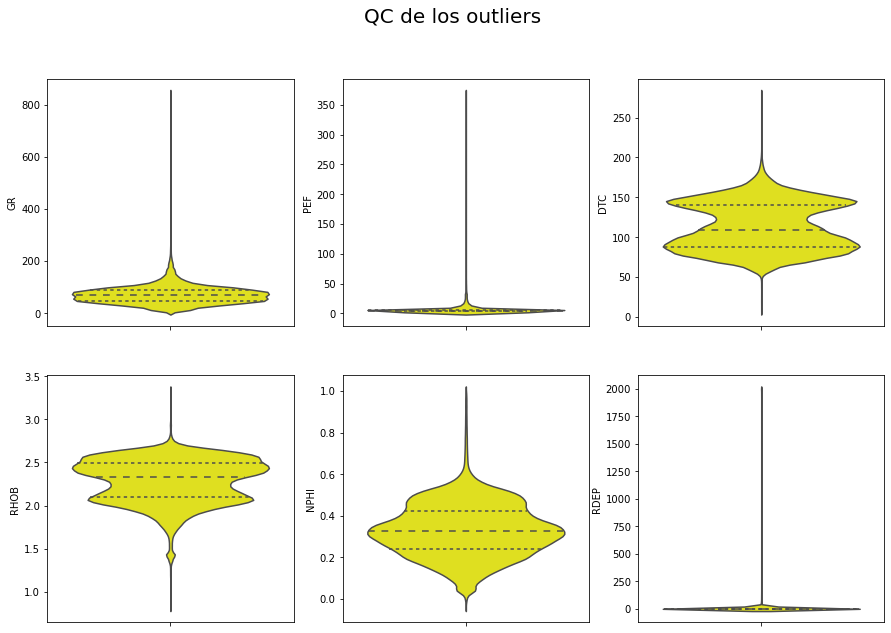

In [52]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))

fig.suptitle('QC de los outliers', fontsize=20, color="black")

sns.violinplot(ax=axes[ 0,0], data=datas1.sample(frac=0.2),  y='GR',color='yellow', inner="quartile")
sns.violinplot(ax=axes[ 0,1], data=datas1.sample(frac=0.2), y='PEF', color='yellow', inner="quartile")
sns.violinplot(ax=axes[ 0,2], data=datas1.sample(frac=0.2), y='DTC', color='yellow', inner="quartile")
sns.violinplot(ax=axes[ 1,0], data=datas1.sample(frac=0.2),  y='RHOB',color='yellow', inner="quartile")
sns.violinplot(ax=axes[ 1,1], data=datas1.sample(frac=0.2), y='NPHI', color='yellow', inner="quartile")
sns.violinplot(ax=axes[ 1,2], data=datas1.sample(frac=0.2), y='RDEP', color='yellow', inner="quartile")

In [53]:
datas1.shape

(1156429, 8)

In [54]:
datas1.dtypes

DEPTH_MD       float64
PEF            float64
RDEP           float64
RHOB           float64
GR             float64
NPHI           float64
DTC            float64
LITH_NUMBER      int64
dtype: object

In [55]:
precent_missing = datas1.isnull().sum()*100/len(datas1)
missing_value_data= pd.DataFrame({'column_name': datas1.columns,
                                'percent_missing': precent_missing}).sort_values('percent_missing', ascending=False)
missing_value_data

,column_name,percent_missing
PEF,PEF,41.987792
NPHI,NPHI,35.030426
RHOB,RHOB,13.944652
DTC,DTC,6.991610
RDEP,RDEP,0.952501
DEPTH_MD,DEPTH_MD,0.000000
GR,GR,0.000000
LITH_NUMBER,LITH_NUMBER,0.000000


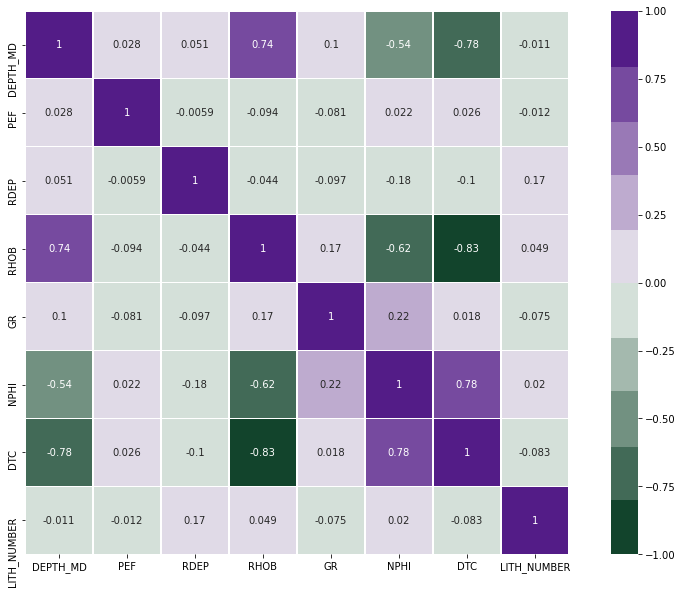

In [56]:
# Establece los límites de colores entre [-1, 1], así como un rango de colores de oscuro a oscuro, pasando por claro (0 correlación)
plt.figure(figsize=(15,10))
sns.heatmap(datas1.corr(),
            vmin=-1,
            vmax=1,
            center=0,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=10),
            square=True,
            annot=True,
            linewidths=.5);

In [57]:
def data_report(df):
    # Sacamos los NOMBRES
    cols = pd.DataFrame(df.columns.values, columns=["COL_N"])

    # Sacamos los TIPOS
    types = pd.DataFrame(df.dtypes.values, columns=["DATA_TYPE"])

    # Sacamos los MISSINGS
    percent_missing = round(df.isnull().sum() * 100 / len(df), 2)
    percent_missing_df = pd.DataFrame(percent_missing.values, columns=["MISSINGS (%)"])

    # Sacamos los VALORES UNICOS
    unicos = pd.DataFrame(df.nunique().values, columns=["UNIQUE_VALUES"])
    
    percent_cardin = round(unicos['UNIQUE_VALUES']*100/len(df), 2)
    percent_cardin_df = pd.DataFrame(percent_cardin.values, columns=["CARDIN (%)"])

    concatenado = pd.concat([cols, types, percent_missing_df, unicos, percent_cardin_df], axis=1, sort=False)
    concatenado.set_index('COL_N', drop=True, inplace=True)


    return concatenado.T
        
data_report(datas1)

COL_N,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC,LITH_NUMBER
DATA_TYPE,float64,float64,float64,float64,float64,float64,float64,int64
MISSINGS (%),0.0,41.99,0.95,13.94,0.0,35.03,6.99,0.0
UNIQUE_VALUES,1132336,656700,1117972,862866,1120806,723395,1015586,11
CARDIN (%),97.92,56.79,96.67,74.61,96.92,62.55,87.82,0.0


In [58]:
datas1.columns

Index(['DEPTH_MD', 'PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC', 'LITH_NUMBER'], dtype='object')

### Visualización de los registros de "features" y de litologia por un pozo

In [59]:
print("Lista de los pozos: ", list_all_wells)

Lista de los pozos:  ['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/1-6 A' '16/10-1' '16/10-2'
 '16/10-3' '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1'
 '16/5-3' '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S'
 '25/11-5' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1'
 '25/5-4' '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1'
 '26/4-1' '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S'
 '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10'
 '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S'
 '33/9-1' '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-13' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R'
 '35/11-1' '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S'
 '35/11-6' '35/11-7' '35/12-1' '35/3-7 S' '35/4-1' '35/8-4' '35/8-6 S'
 '35/9-10 S' '35/9-2' '35/9-5' '35/9-6 S' '36/7-3' '7/1-

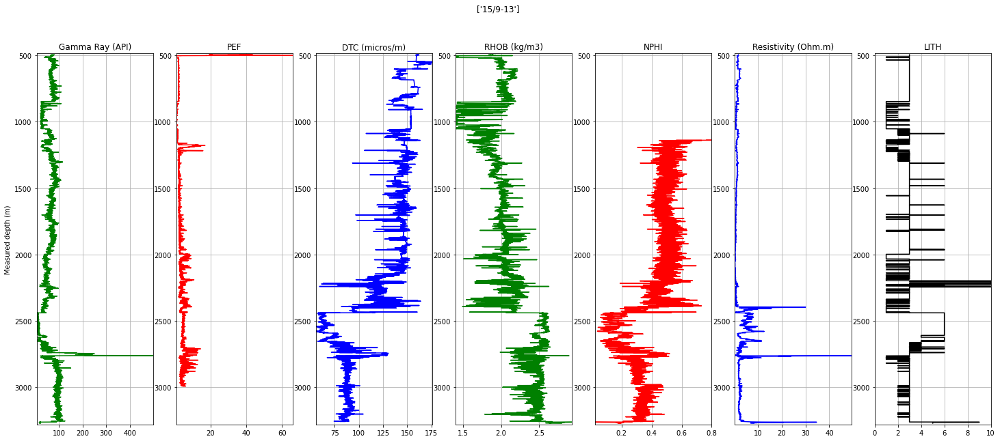

In [60]:
plot_logs(data[data["WELL"]==list_all_wells[0]])

## 5/ Separacion y pre-acondicionamiento de los datos de entrenamiento y de testeo

In [61]:
datas2=datas1.sample(frac=0.1, random_state=24)

In [62]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(datas2.drop('LITH_NUMBER', axis=1),
                                                    datas2['LITH_NUMBER'],
                                                    test_size=0.2,
                                                    random_state=42)

In [63]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(92514, 7)
(92514,)
(23129, 7)
(23129,)


In [64]:
# Ejemplo de código para un StandardScaler
from sklearn.preprocessing import StandardScaler

# Almaceno en el objeto scaler todo lo necesario para estandarizar, con los datos de train
scaler = StandardScaler()
scaler.fit(X_train)

# Utilizo los datos de train para escalar train y test.
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [65]:
X_train_scaled

array([[-0.08537319, -0.18223987, -0.07780819, ..., -0.71959557,
        -0.06038938, -0.36485412],
       [-0.78395659,         nan, -0.08311698, ..., -0.833866  ,
                nan,  0.82342023],
       [ 0.54276111, -0.02258471, -0.06124427, ..., -0.40470391,
         0.06531146, -0.83485253],
       ...,
       [-1.07087464,         nan, -0.07842482, ...,  0.01972976,
                nan,  1.51040799],
       [ 1.3872055 , -0.06740654,  0.00733872, ...,  0.82726371,
        -1.18732496, -1.26693832],
       [ 1.30487954, -0.12923045, -0.03454701, ...,  0.18765497,
        -0.99821099, -1.25203802]])

In [66]:
X_test_scaled

array([[-1.4296167 , -0.18375918, -0.08575983, ..., -1.61276364,
                nan,  1.34151662],
       [ 0.92475712, -0.28319272, -0.04405876, ...,  0.49958445,
        -0.53249782, -1.19374955],
       [ 0.55083442, -0.23509053, -0.07684557, ...,  0.39577673,
        -0.2880407 , -0.41757361],
       ...,
       [-0.23657458,         nan, -0.08062923, ..., -0.78401276,
         0.79301141,  0.31349021],
       [-1.14033889,         nan, -0.08179274, ...,  0.1201734 ,
                nan,         nan],
       [ 0.04832053, -0.21507315, -0.08840004, ..., -1.39253987,
                nan, -0.22977891]])

In [67]:
X_trains = pd.DataFrame(X_train_scaled,index=X_train.index, columns=datas2.columns[:-1])
X_tests = pd.DataFrame(X_test_scaled,index=X_test.index, columns=datas2.columns[:-1])


In [68]:
X_trains.head(1000)

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC
772245,-0.085373,-0.182240,-0.077808,0.473049,-0.719596,-0.060389,-0.364854
469743,-0.783957,NaN,-0.083117,NaN,-0.833866,NaN,0.823420
321723,0.542761,-0.022585,-0.061244,0.421109,-0.404704,0.065311,-0.834853
521715,-1.327041,NaN,-0.082607,NaN,-1.381465,NaN,1.304448
212920,-0.370712,NaN,-0.083113,-0.122017,0.465595,0.516719,0.589117
...,...,...,...,...,...,...,...
337255,-0.852989,-0.374992,-0.084129,-0.804760,-1.482430,NaN,0.906742
658760,0.111426,-0.208324,-0.073792,0.466743,0.490906,0.180739,-0.674161
634880,0.285278,NaN,-0.066110,0.614228,-0.061946,-0.155328,-0.651797
1029455,-0.551664,-0.041286,-0.085101,-0.410780,-0.294454,NaN,0.778300


In [69]:
y_trains = pd.DataFrame(y_train)
y_trains
y_tests = pd.DataFrame(y_test)
y_tests

,LITH_NUMBER
333453,1
464068,3
746548,3
360099,3
300919,6
...,...
586582,1
619069,3
528905,10
438412,3


In [70]:
"""
# Imputacion mediante KNN
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
imputer.fit(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])
X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']] = imputer.transform(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])

X_tests[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']] = imputer.transform(X_tests[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])
X_tests.describe()
"""

"\n# Imputacion mediante KNN\nfrom sklearn.impute import KNNImputer\n\nimputer = KNNImputer(n_neighbors=5)\nimputer.fit(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])\nX_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']] = imputer.transform(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])\n\nX_tests[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']] = imputer.transform(X_tests[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])\nX_tests.describe()\n"

In [71]:
"""
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imputer = IterativeImputer(max_iter=10, random_state=42,n_nearest_features=5)


imputer.fit(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])

itim= imputer.fit_transform(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])

X_trains=pd.DataFrame(itim, columns=['PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC'])
#itim= imputer.fit_transform(X_tests[['PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])
#X_tests=pd.DataFrame(itim, columns=['PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC'])
X_trains.describe()
"""

"\nimport numpy as np\nfrom sklearn.experimental import enable_iterative_imputer\nfrom sklearn.impute import IterativeImputer\nimputer = IterativeImputer(max_iter=10, random_state=42,n_nearest_features=5)\n\n\nimputer.fit(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])\n\nitim= imputer.fit_transform(X_trains[['PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])\n\nX_trains=pd.DataFrame(itim, columns=['PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC'])\n#itim= imputer.fit_transform(X_tests[['PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC']])\n#X_tests=pd.DataFrame(itim, columns=['PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC'])\nX_trains.describe()\n"

In [72]:
X_trains['DTC'] = X_trains['DTC'].fillna(0)
X_trains['RHOB'] = X_trains['RHOB'].fillna(0)
X_trains['PEF'] = X_trains['PEF'].fillna(0)
X_trains['RDEP'] = X_trains['RDEP'].fillna(0)
X_trains['NPHI'] = X_trains['NPHI'].fillna(0)
X_trains.describe()

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC
count,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04
mean,-3.743706e-16,-1.809030e-17,-1.181691e-17,-8.919130e-16,3.355126e-17,-3.086097e-16,3.508998e-16
std,1.000005e+00,7.616941e-01,9.951457e-01,9.280948e-01,1.000005e+00,8.059210e-01,9.644486e-01
min,-2.044713e+00,-5.666803e-01,-9.187731e-02,-5.934691e+00,-2.027871e+00,-2.734602e+00,-3.514736e+00
25%,-7.667357e-01,-2.073343e-01,-8.386432e-02,-6.360641e-01,-6.810113e-01,-3.208075e-01,-8.136784e-01
50%,-1.095643e-01,0.000000e+00,-7.901482e-02,0.000000e+00,-7.849208e-02,0.000000e+00,0.000000e+00
75%,6.806208e-01,0.000000e+00,-6.858347e-02,7.006625e-01,5.289782e-01,2.413569e-01,8.632218e-01
max,3.238213e+00,3.207169e+01,1.793671e+01,4.225456e+00,1.673239e+01,5.133481e+00,4.082555e+00


In [73]:
X_tests['DTC'] = X_tests['DTC'].fillna(0)
X_tests['RHOB'] = X_tests['RHOB'].fillna(0)
X_tests['PEF'] = X_tests['PEF'].fillna(0)
X_tests['RDEP'] = X_tests['RDEP'].fillna(0)
X_tests['NPHI'] = X_tests['NPHI'].fillna(0)
X_tests.describe()

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC
count,23129.000000,23129.000000,23129.000000,23129.000000,23129.000000,23129.000000,23129.000000
mean,-0.003014,0.003976,-0.005147,-0.000081,0.013792,-0.002312,0.003791
std,0.993422,0.822111,0.959033,0.930085,1.019030,0.798896,0.968986
min,-2.038799,-0.566680,-0.091537,-4.994129,-2.027762,-2.649776,-3.488140
25%,-0.766399,-0.204362,-0.083894,-0.633579,-0.679905,-0.322335,-0.805097
50%,-0.106356,0.000000,-0.079134,0.000000,-0.065936,0.000000,0.000000
75%,0.677576,0.000000,-0.068883,0.703633,0.540424,0.223097,0.869619
max,3.238516,33.582141,17.935817,3.400007,17.467857,5.002765,6.690980


In [74]:
precent_missing = X_trains.isnull().sum()*100/len(X_trains)
missing_value_data= pd.DataFrame({'column_name': X_trains.columns,
                                'percent_missing': precent_missing}).sort_values('percent_missing', ascending=False)
missing_value_data

,column_name,percent_missing
DEPTH_MD,DEPTH_MD,0.0
PEF,PEF,0.0
RDEP,RDEP,0.0
RHOB,RHOB,0.0
GR,GR,0.0
NPHI,NPHI,0.0
DTC,DTC,0.0


In [75]:
Xy_trains=pd.concat([X_trains, y_trains] , axis=1)

In [76]:
Xy_tests=pd.concat([X_test, y_tests] , axis=1)

In [77]:
y_trains

,LITH_NUMBER
772245,3
469743,3
321723,4
521715,1
212920,3
...,...
465821,3
547959,3
173848,3
1147503,3


In [78]:
Xy_trains.shape

(92514, 8)

In [79]:
Xy_tests.shape

(23129, 8)

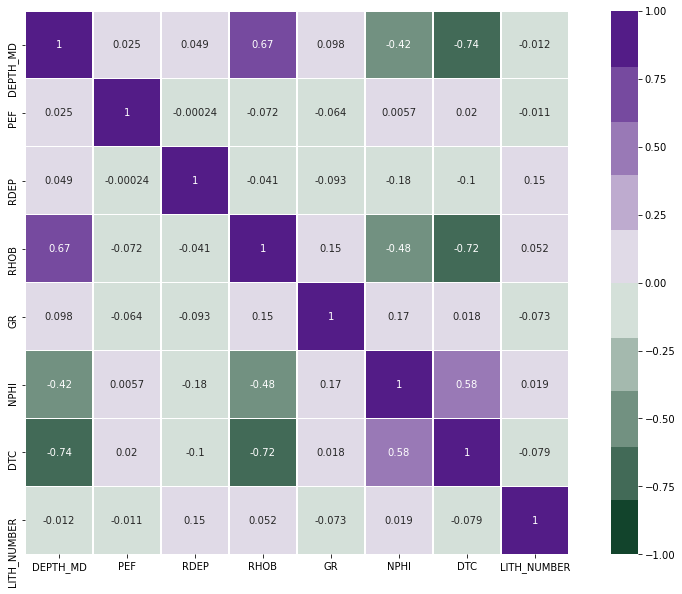

In [80]:
# Establece los límites de colores entre [-1, 1], así como un rango de colores de oscuro a oscuro, pasando por claro (0 correlación)
plt.figure(figsize=(15,10))
sns.heatmap(Xy_trains.corr(),
            vmin=-1,
            vmax=1,
            center=0,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=10),
            square=True,
            annot=True,
            linewidths=.5);

In [81]:
X_trains.describe()

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC
count,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04,9.251400e+04
mean,-3.743706e-16,-1.809030e-17,-1.181691e-17,-8.919130e-16,3.355126e-17,-3.086097e-16,3.508998e-16
std,1.000005e+00,7.616941e-01,9.951457e-01,9.280948e-01,1.000005e+00,8.059210e-01,9.644486e-01
min,-2.044713e+00,-5.666803e-01,-9.187731e-02,-5.934691e+00,-2.027871e+00,-2.734602e+00,-3.514736e+00
25%,-7.667357e-01,-2.073343e-01,-8.386432e-02,-6.360641e-01,-6.810113e-01,-3.208075e-01,-8.136784e-01
50%,-1.095643e-01,0.000000e+00,-7.901482e-02,0.000000e+00,-7.849208e-02,0.000000e+00,0.000000e+00
75%,6.806208e-01,0.000000e+00,-6.858347e-02,7.006625e-01,5.289782e-01,2.413569e-01,8.632218e-01
max,3.238213e+00,3.207169e+01,1.793671e+01,4.225456e+00,1.673239e+01,5.133481e+00,4.082555e+00


In [82]:
y_train.shape

(92514,)

In [83]:
y_trains['LITH_NUMBER'].value_counts()

3     57054
1     13379
2     11823
6      4481
4      2652
10     1203
7       838
8       629
11      287
5       119
9        49
Name: LITH_NUMBER, dtype: int64

## 6/ Elección y entrenamiento de los modelos de ML ((Random Forest, Gradient Boosting, XGBoosting)

In [84]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import fbeta_score, make_scorer
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score,  roc_auc_score, f1_score
#create a new random forest classifier
rf = RandomForestClassifier()
gb=GradientBoostingClassifier()
xgb = XGBClassifier()
#create a dictionary of all values we want to test for n_estimators

#params_rf = {"n_estimators": [120], "max_depth":[5,10, 20],"class_weight":["balanced","balanced_subsample"], "random_state":[42], "max_features": ["sqrt", 3, 4] }
params_rf = {"n_estimators": [120], "max_depth":[10],"class_weight":["balanced"], "random_state":[42], "max_features": [4] }
params_gb = {"loss": ["deviance"], "learning_rate": [0.2],  "n_estimators": [50],   "max_depth": [3],  "max_features": [4], "random_state":[42]}


#params_xgb =  { "n_estimators":[50,100, 200], "max_depth":[5,10, 20],"scale_pos_weight":[100],"subsample":[0.6,0.8], "learning_rate":[0.1, 0.3], "random_state":[0]}



params_xgb =  { "n_estimators":[100], "max_depth":[10],"scale_pos_weight":[1000],  "subsample":[0.5], "learning_rate":[0.02], "num_boost_round":[500],  "gamma":[3],"random_state":[42]}






## MEJOR SCORE
#params_xgb =  { "n_estimators":[100], "max_depth":[10],"scale_pos_weight":[1000],"subsample":[0.5], "learning_rate":[0.02], "num_boost_round":[500], "gamma":[3],"random_state":[42]}



# Almaceno en una lista de tuplas los modelos (nombre que le pongo, el modelo, hiperparametros)
#models = [('grad_boost', gb, params_gb),('rand_forest', rf, params_rf), ('XGboost', xgb, params_xgb)]
models = [('XGboost', xgb, params_xgb)]

# Declaro en un diccionario los pipelines e hiperparametros
models_gridsearch = {}

for i in models:
    models_gridsearch[i[0]] = GridSearchCV(i[1],
                                          i[2],
                                          cv=10,
                                      # scoring=make_scorer(score, greater_is_better=True),
                                       scoring="accuracy",
                                      # scoring="f1_samples",
                                      # scoring="f1_macro",
                                      # scoring="roc_auc_ovr",
                                     # scoring="roc_auc_ovr_weighted",
                                      # scoring="roc_auc_ovo",
                                      #scoring="roc_auc_ovo_weighted",
                                          verbose=3,  n_jobs=-1) 
    models_gridsearch[i[0]].fit(X_trains, y_trains)

Fitting 10 folds for each of 1 candidates, totalling 10 fits
[23:54:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "num_boost_round", "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:54:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [85]:
best_grids = [(i, j.best_score_) for i, j in models_gridsearch.items()]

best_grids = pd.DataFrame(best_grids, columns=["Grid", "Best score"]).sort_values(by="Best score", ascending=False)
best_grids

,Grid,Best score
0,XGboost,0.824048


In [86]:
#models_gridsearch['rand_forest'].best_estimator_
models_gridsearch['XGboost'].best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=3, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.02, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_boost_round=500,
              num_parallel_tree=1, objective='multi:softprob', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1000, subsample=0.5,
              tree_method='exact', validate_parameters=1, verbosity=None)

## 7/  QC modelo ML elegido (XGBoost clasifier) con datos de entrenamiento y testeo

In [87]:
# models_gridsearch['rand_forest'].best_estimator_.score(X_trains, y_trains)
models_gridsearch['XGboost'].best_estimator_.score(X_trains, y_trains).round(2)

0.85

In [88]:
#models_gridsearch['rand_forest'].best_estimator_.score(X_tests, y_tests)
models_gridsearch['XGboost'].best_estimator_.score(X_tests, y_tests).round(2)

0.83

In [89]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score,\
                            roc_auc_score, roc_curve, precision_recall_curve, confusion_matrix
from sklearn.model_selection import train_test_split

y_pred_train = models_gridsearch['XGboost'].predict(X_trains)
y_pred_test = models_gridsearch['XGboost'].predict(X_tests)

In [90]:
print("Accuracy score entrenamiento:", round(accuracy_score(y_pred_train,y_trains), 3))
print("F1 score entrenamiento:", round(f1_score(y_pred_train, y_trains, average="weighted"), 3))

Accuracy score entrenamiento: 0.851
F1 score entrenamiento: 0.865


In [91]:
print("Accuracy score testeo:", round(accuracy_score(y_pred_test,y_tests), 3))
print("F1 score testo:", round(f1_score(y_pred_test, y_tests, average="weighted"), 3))

Accuracy score testeo: 0.831
F1 score testo: 0.848


In [92]:
target_test =y_test.to_numpy()
target_train =y_train.to_numpy()

In [93]:
print("Error ponderado - datos de entrenamiento: ",score(y_pred_train, target_train).round(3))

Error ponderado - datos de entrenamiento:  -0.368


In [94]:
print("Error ponderado  - datos de testeo: ",score(y_pred_test,target_test).round(3))

Error ponderado  - datos de testeo:  -0.422


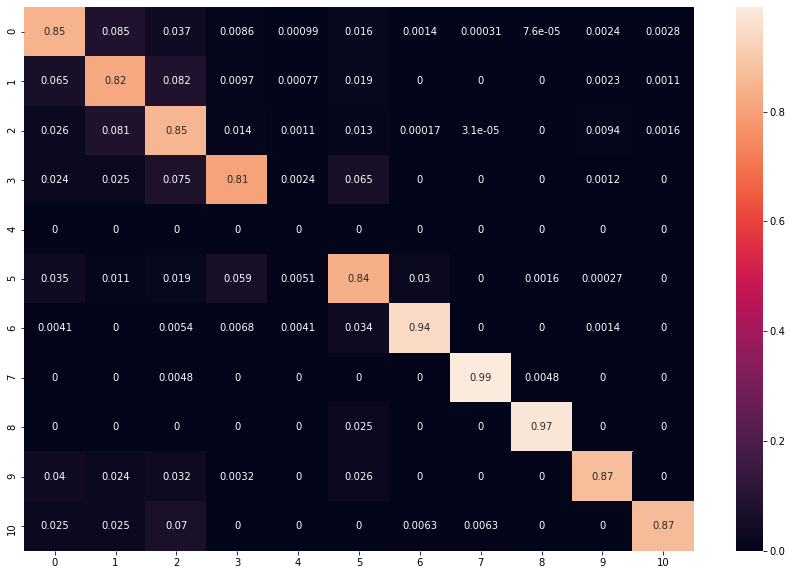

In [95]:
c_matrix = confusion_matrix(y_pred_train, target_train, normalize="true")
fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_matrix, annot=True);

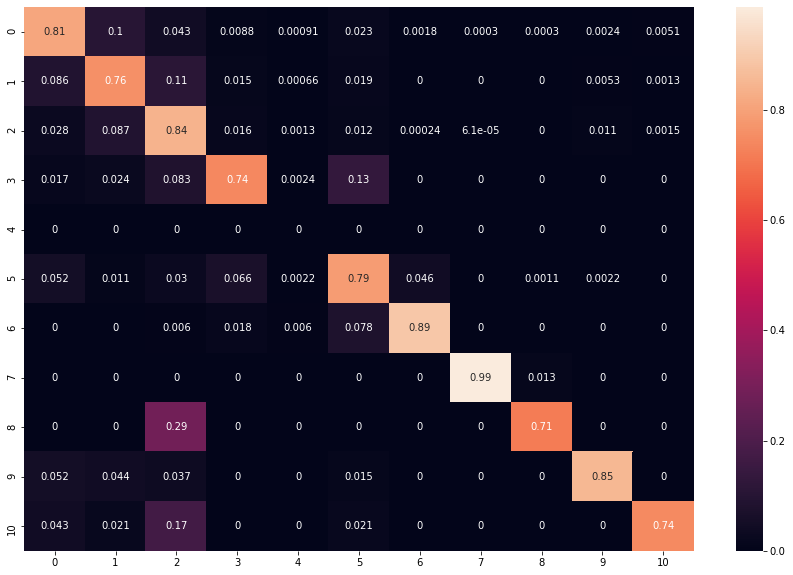

In [96]:
c_matrix = confusion_matrix(y_pred_test, target_test, normalize="true")
fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_matrix, annot=True);

## 8/ QC modelo ML con datos de validación

In [97]:
val_feat=pd.read_csv(r"./data/raw/leaderboard_test_features.csv", sep=";")
val_feat.shape

(136786, 27)

In [98]:
val_feat.columns

Index(['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'GROUP', 'FORMATION',
       'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'SGR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DTS', 'DCAL', 'DRHO', 'MUDWEIGHT', 'RMIC',
       'ROPA', 'RXO'],
      dtype='object')

In [99]:
val_tar=pd.read_csv(r"./data/raw/leaderboard_test_target.csv", sep=";")
val_tar.shape

(136786, 3)

In [100]:
val_tar

,WELL,DEPTH_MD,FORCE_2020_LITHOFACIES_LITHOLOGY
0,15/9-14,480.628001,65000
1,15/9-14,480.780001,65000
2,15/9-14,480.932001,65000
3,15/9-14,481.084001,65000
4,15/9-14,481.236001,65000
...,...,...,...
136781,35/9-8,3224.389600,30000
136782,35/9-8,3224.541600,30000
136783,35/9-8,3224.693600,30000
136784,35/9-8,3224.845600,30000


In [101]:
val_tar.columns

Index(['WELL', 'DEPTH_MD', 'FORCE_2020_LITHOFACIES_LITHOLOGY'], dtype='object')

In [102]:
val_tar['LITH'] =val_tar['FORCE_2020_LITHOFACIES_LITHOLOGY'].map(lithology_numbers)
val_tar['LITH_NUMBER'] = val_tar['LITH'].map(lithology_numbers2)
val_tar.drop(columns=['FORCE_2020_LITHOFACIES_LITHOLOGY', 'LITH'], inplace=True)
val_tar.columns


Index(['WELL', 'DEPTH_MD', 'LITH_NUMBER'], dtype='object')

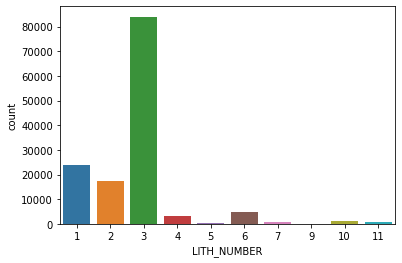

In [103]:
sns.countplot(x = 'LITH_NUMBER', data=val_tar);

In [104]:
val_tar['LITH_NUMBER'].value_counts()

3     83975
1     24048
2     17558
6      4798
4      3306
10     1245
11      690
7       625
5       416
9       125
Name: LITH_NUMBER, dtype: int64

In [105]:
val=pd.merge(val_feat,val_tar ,left_on="DEPTH_MD", right_on="DEPTH_MD",suffixes=('', "y")).drop(columns="WELLy") # como inner join
val.shape

(136786, 28)

In [106]:
val.columns

Index(['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC', 'Z_LOC', 'GROUP', 'FORMATION',
       'CALI', 'RSHA', 'RMED', 'RDEP', 'RHOB', 'GR', 'SGR', 'NPHI', 'PEF',
       'DTC', 'SP', 'BS', 'ROP', 'DTS', 'DCAL', 'DRHO', 'MUDWEIGHT', 'RMIC',
       'ROPA', 'RXO', 'LITH_NUMBER'],
      dtype='object')

In [107]:
precent_missing =round(val.isnull().sum()*100/len(val),2)
missing_value_data= pd.DataFrame({'column_name': val.columns,
                                'percent_missing': precent_missing}).sort_values('percent_missing', ascending=False)
missing_value_data


,column_name,percent_missing
SGR,SGR,100.00
RMIC,RMIC,91.73
DCAL,DCAL,90.12
MUDWEIGHT,MUDWEIGHT,85.18
RXO,RXO,78.18
RSHA,RSHA,71.42
DTS,DTS,68.40
ROPA,ROPA,59.21
SP,SP,51.29
BS,BS,51.04


In [108]:
val2=val[["DEPTH_MD",'PEF',  'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC', 'LITH_NUMBER']]

val2.columns

Index(['DEPTH_MD', 'PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC', 'LITH_NUMBER'], dtype='object')

In [109]:
precent_missing = round(val2.isnull().sum()*100/len(val2),2)
missing_value_data= pd.DataFrame({'column_name':val2.columns,
                                'percent_missing': precent_missing}).sort_values('percent_missing', ascending=False)
missing_value_data


,column_name,percent_missing
NPHI,NPHI,23.94
PEF,PEF,17.02
RHOB,RHOB,12.40
DTC,DTC,0.60
RDEP,RDEP,0.04
DEPTH_MD,DEPTH_MD,0.00
GR,GR,0.00
LITH_NUMBER,LITH_NUMBER,0.00


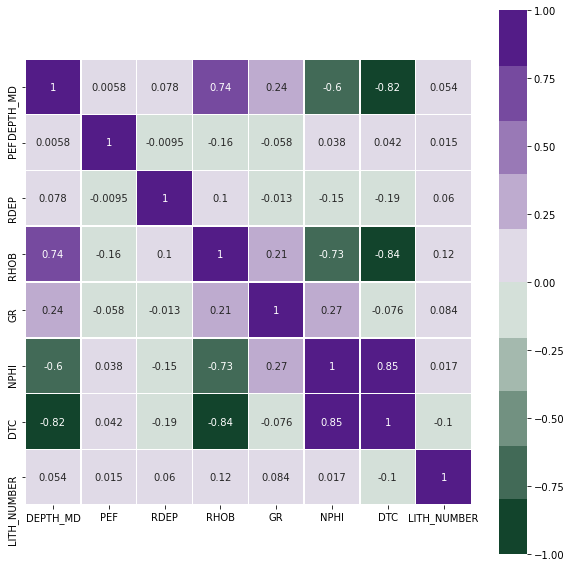

In [110]:
# Establece los límites de colores entre [-1, 1], así como un rango de colores de oscuro a oscuro, pasando por claro (0 correlación)
plt.figure(figsize=(10,10))
sns.heatmap(val2.corr(),
            vmin=-1,
            vmax=1,
            center=0,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=10),
            square=True,
            annot=True,
            linewidths=.5);

In [111]:
val2s = scaler.transform(val2.iloc[:,:-1])
val2s

array([[-1.70396555,  4.53763581, -0.07852304, ...,  0.03374062,
         1.69562207,  2.04350678],
       [-1.70381389,  3.25933912, -0.07882731, ...,  0.03575925,
         1.66471858,  2.10258372],
       [-1.70366222,  2.95933496, -0.07892186, ...,  0.12097988,
         1.69766254,  2.15442542],
       ...,
       [ 1.03404067, -0.13914262, -0.03502532, ..., -0.20418554,
        -1.15824555, -1.50712095],
       [ 1.03419234, -0.14315027, -0.04108783, ..., -0.18484419,
        -1.14598397, -1.49094237],
       [ 1.034344  , -0.14641606, -0.0447331 , ..., -0.02972569,
        -1.14213838, -1.46927905]])

In [112]:
val2s.shape

(136786, 7)

In [113]:
val2.columns[:-1]

Index(['DEPTH_MD', 'PEF', 'RDEP', 'RHOB', 'GR', 'NPHI', 'DTC'], dtype='object')

In [114]:
val2.index

Int64Index([     0,      1,      2,      3,      4,      5,      6,      7,
                 8,      9,
            ...
            136776, 136777, 136778, 136779, 136780, 136781, 136782, 136783,
            136784, 136785],
           dtype='int64', length=136786)

In [115]:
val3 = pd.DataFrame(val2s,index=val2.index, columns=val2.columns[:-1])

In [116]:
val_def=val3.copy(deep=True)

In [117]:
val_def['DTC'] = val_def['DTC'].fillna(0)
val_def['RHOB'] = val_def['RHOB'].fillna(0)
val_def['PEF'] = val_def['PEF'].fillna(0)
val_def['RDEP'] = val_def['RDEP'].fillna(0)
val_def['NPHI'] = val_def['NPHI'].fillna(0)
val_def.describe()

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC
count,136786.000000,136786.000000,136786.000000,136786.000000,136786.000000,136786.000000,136786.000000
mean,0.312082,-0.013064,-0.059131,0.132598,-0.165881,-0.106510,-0.142563
std,1.040942,0.827091,0.209506,0.906429,0.906991,0.805996,0.909277
min,-1.956738,-0.519999,-0.090799,-3.956855,-1.880498,-2.623605,-2.261053
25%,-0.479355,-0.262018,-0.084031,-0.561940,-0.767677,-0.624900,-0.874728
50%,0.282833,-0.130315,-0.077222,0.114747,-0.314766,0.000000,-0.337448
75%,1.103836,0.000000,-0.066041,0.904007,0.344722,0.232304,0.740737
max,2.812828,34.431742,14.171346,3.122584,12.520445,3.999446,2.349081


In [118]:
val_def.describe()

,DEPTH_MD,PEF,RDEP,RHOB,GR,NPHI,DTC
count,136786.000000,136786.000000,136786.000000,136786.000000,136786.000000,136786.000000,136786.000000
mean,0.312082,-0.013064,-0.059131,0.132598,-0.165881,-0.106510,-0.142563
std,1.040942,0.827091,0.209506,0.906429,0.906991,0.805996,0.909277
min,-1.956738,-0.519999,-0.090799,-3.956855,-1.880498,-2.623605,-2.261053
25%,-0.479355,-0.262018,-0.084031,-0.561940,-0.767677,-0.624900,-0.874728
50%,0.282833,-0.130315,-0.077222,0.114747,-0.314766,0.000000,-0.337448
75%,1.103836,0.000000,-0.066041,0.904007,0.344722,0.232304,0.740737
max,2.812828,34.431742,14.171346,3.122584,12.520445,3.999446,2.349081


In [119]:
pred_val_def= models_gridsearch['XGboost'].predict(val_def)

In [120]:
target_val = val2["LITH_NUMBER"].to_numpy()

In [121]:
print("Accuracy score val:", round(accuracy_score(pred_val_def,target_val), 3))
print("F1 score val:", round(f1_score(pred_val_def, target_val, average="weighted"), 3))

Accuracy score val: 0.771
F1 score val: 0.799


In [122]:
comp_table1=pd.DataFrame(data=pred_val_def, columns=["pred"])
comp_table2=pd.DataFrame(data=target_val, columns=["target"])

In [123]:
comp_table=pd.concat([comp_table1,comp_table2] , axis=1)

In [124]:
comp_table.head(500)

,pred,target
0,3,3
1,3,3
2,3,3
3,3,3
4,3,3
...,...,...
495,3,3
496,3,3
497,3,3
498,3,3


In [125]:
print("Error ponderado  - datos de validacion: ",score(pred_val_def,target_val).round(3))

Error ponderado  - datos de validacion:  -0.567


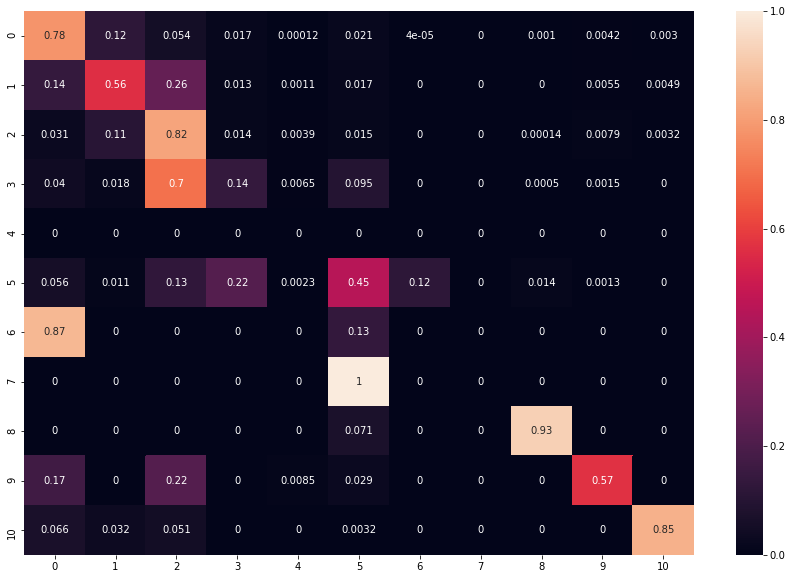

In [126]:
c_matrix = confusion_matrix(pred_val_def,target_val, normalize="true")
fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_matrix, annot=True);

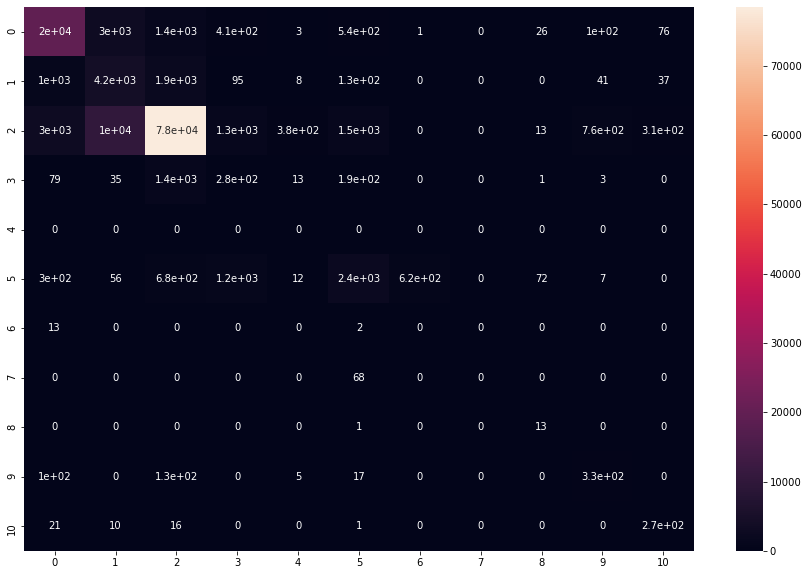

In [127]:
c_matrix = confusion_matrix(pred_val_def,target_val)
fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_matrix, annot=True);

## 9/ Backup modelo

In [128]:
# Guardar el modelo
import pickle

with open('.\\model\\xgboost_model.model', "wb") as model_salida:
    pickle.dump(models_gridsearch['XGboost'].best_estimator_, model_salida)

In [129]:
# Para volver a leer el modelo
with open('.\\model\\xgboost_model.model', "rb") as model_entrada:
    xgboost_importado = pickle.load(model_entrada)
    
print(xgboost_importado)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=3, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.02, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_boost_round=500,
              num_parallel_tree=1, objective='multi:softprob', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1000, subsample=0.5,
              tree_method='exact', validate_parameters=1, verbosity=None)


## 10/ Backup datos procesados y QC final

### Backup datos procesados (entrenamiento, testeo, validacion)

#### Features

In [130]:
#feature files
print(X_tests.info())
X_tests.to_pickle('.\\data\\processed\\X_test_df.pkl')
X_test_load = pd.read_pickle('.\\data\\processed\\X_test_df.pkl')
print(X_test_load.info())

print(X_trains.info())
X_trains.to_pickle('.\\data\\processed\\X_train_df.pkl')
X_train_load = pd.read_pickle('.\\data\\processed\\X_train_df.pkl')
print(X_train_load.info())

print(val_def.info())
val_def.to_pickle('.\\data\\processed\\X_val_df.pkl')
X_val_load = pd.read_pickle('.\\data\\processed\\X_val_df.pkl')
print(X_val_load.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23129 entries, 333453 to 298325
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DEPTH_MD  23129 non-null  float64
 1   PEF       23129 non-null  float64
 2   RDEP      23129 non-null  float64
 3   RHOB      23129 non-null  float64
 4   GR        23129 non-null  float64
 5   NPHI      23129 non-null  float64
 6   DTC       23129 non-null  float64
dtypes: float64(7)
memory usage: 1.4 MB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 23129 entries, 333453 to 298325
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DEPTH_MD  23129 non-null  float64
 1   PEF       23129 non-null  float64
 2   RDEP      23129 non-null  float64
 3   RHOB      23129 non-null  float64
 4   GR        23129 non-null  float64
 5   NPHI      23129 non-null  float64
 6   DTC       23129 non-null  float64
dtypes: float64(7)
memory

#### Targets

In [131]:
#target files
print(target_train.shape)
with open('.\\data\\processed\\target_train_np.pkl','wb') as target_train2:
    pickle.dump(target_train,  target_train2)
    
with open('.\\data\\processed\\target_train_np.pkl','rb') as  target_train2:
    y_train_load = pickle.load(target_train2)
    print(y_train_load.shape)
##
print(target_test.shape)
with open('.\\data\\processed\\target_test_np.pkl','wb') as target_test2:
    pickle.dump(target_test,  target_test2)
    
with open('.\\data\\processed\\target_test_np.pkl','rb') as  target_test2:
    y_test_load = pickle.load(target_test2)
    print(y_test_load.shape)
##
print(target_val.shape)
with open('.\\data\\processed\\target_val_np.pkl','wb') as target_val2:
    pickle.dump(target_val,  target_val2)
    
with open('.\\data\\processed\\target_val_np.pkl','rb') as  target_val2:
    y_val_load = pickle.load(target_val2)
    print(y_val_load.shape)


(92514,)
(92514,)
(23129,)
(23129,)
(136786,)
(136786,)


### QC prediciones

In [132]:
y_pred_train_load = xgboost_importado.predict(X_train_load)
y_pred_test_load = xgboost_importado.predict(X_test_load)
y_pred_val_load= xgboost_importado.predict(X_val_load)

In [133]:
score_train=xgboost_importado.score(X_train_load, y_train_load)
print("Valor de exactitud - datos de entrenamiento: ", score_train.round(3))
print("Valor F1 - datos de entrenamiento:", round(f1_score(y_pred_train_load, y_train_load, average="weighted"), 3))

Valor de exactitud - datos de entrenamiento:  0.851
Valor F1 - datos de entrenamiento: 0.865


In [134]:
score_te=xgboost_importado.score(X_test_load, y_test_load)
print("Valor de exactitud - datos de testo: ", score_te.round(3))
print("Valor F1 - datos de testeo:", round(f1_score(y_pred_test_load, y_test_load, average="weighted"), 3))

Valor de exactitud - datos de testo:  0.831
Valor F1 - datos de testeo: 0.848


In [135]:
score_va=xgboost_importado.score(X_val_load, y_val_load)
print("Valor de exactitud - datos de validación: ", score_va.round(3))
print("Valor F1 - datos de validación:", round(f1_score(y_pred_val_load, y_val_load, average="weighted"), 3))

Valor de exactitud - datos de validación:  0.771
Valor F1 - datos de validación: 0.799


### QC matrices de confusion

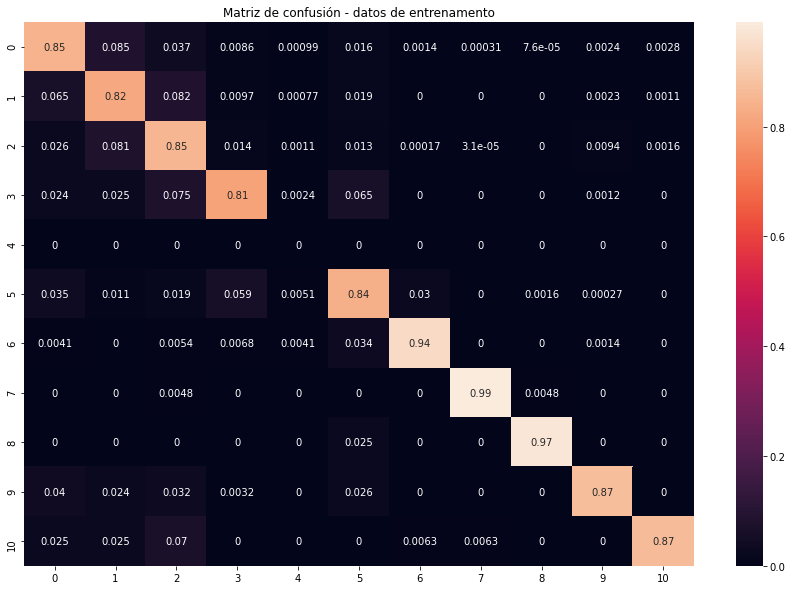

In [136]:
c_mat_tr = confusion_matrix(y_pred_train_load, y_train_load, normalize="true")

fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_mat_tr, annot=True).set(title='Matriz de confusión - datos de entrenamento') ;

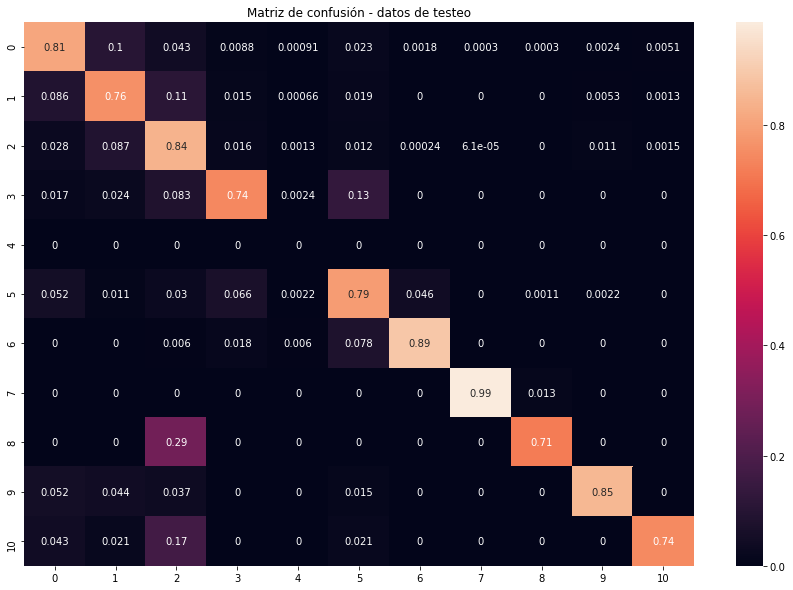

In [137]:
c_mat_te = confusion_matrix(y_pred_test_load, y_test_load, normalize="true")

fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_mat_te, annot=True).set(title='Matriz de confusión - datos de testeo') ;

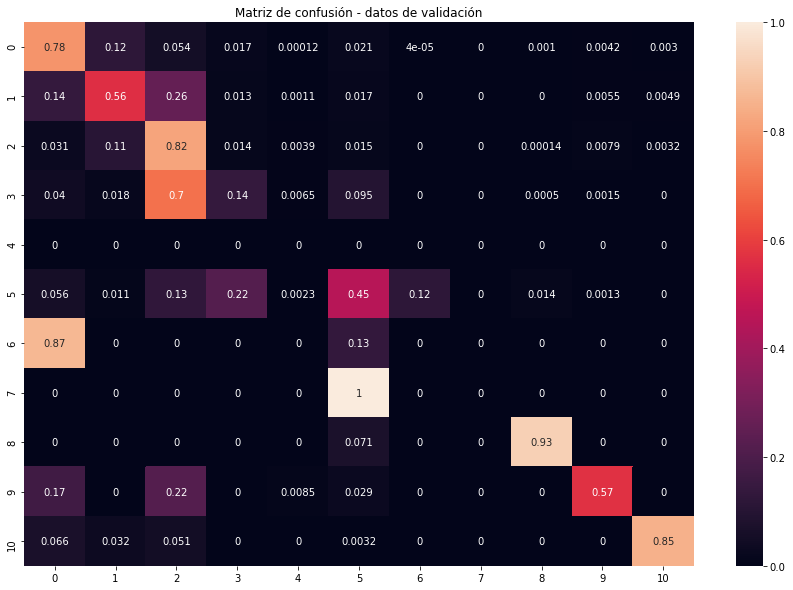

In [138]:
c_mat_val = confusion_matrix(y_pred_val_load, y_val_load, normalize="true")

fig, axes = plt.subplots(1, 1, figsize=(15, 10))
sns.heatmap(c_mat_val, annot=True).set(title='Matriz de confusión - datos de validación') ;

### QC error ponderado

In [139]:
s_tr=score(y_pred_train_load, y_train_load)
print("Error ponderado - datos de entrenamiento: ", s_tr.round(3))

Error ponderado - datos de entrenamiento:  -0.368


In [140]:
s_tes=score(y_pred_test_load, y_test_load)
print("Error ponderado  - datos de entrenamiento: ", s_tes.round(3))

Error ponderado  - datos de entrenamiento:  -0.422


In [141]:
s_val=score(y_pred_val_load, y_val_load)
print("Error ponderado  - datos de validacion: ", s_val.round(3))

Error ponderado  - datos de validacion:  -0.567


## 11/ Generación de ficheros con transformación de coordenades UTM (X - Y) de los pozos en longitud y latitud  para visualizaciòn en Streamlit

In [142]:
set_pozos_train_test=data[['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC']]
set_pozos_val=val_feat[['WELL', 'DEPTH_MD', 'X_LOC', 'Y_LOC']]

In [143]:
data_coord_lon_lat_train_test=calc_coord(set_pozos_train_test)
data_coord_lon_lat_train_test

,WELL,DEPTH_MD,X_LOC,Y_LOC,lat,lon
0,15/9-13,494.528000,437641.96875,6470972.5,58.375153,1.933836
1,15/9-15,485.256000,436817.90625,6462991.5,58.303366,1.921935
2,15/9-17,472.429998,438591.96875,6478951.5,58.446938,1.947942
3,16/1-2,2645.580001,455221.34375,6533321.5,58.937216,2.221999
4,16/1-6 A,1175.979735,459499.68750,6539423.0,58.992433,2.295208
...,...,...,...,...,...,...
86,35/9-2,1005.688358,550199.50000,6800708.0,61.337201,3.938129
87,35/9-5,2726.167587,543505.68750,6799385.5,61.326136,3.812743
88,35/9-6 S,1725.152000,537126.50000,6804497.0,61.372681,3.694598
89,36/7-3,2391.104000,556075.18750,6810860.0,61.427522,4.050967


In [144]:
data_coord_lon_lat_train_test.to_csv (r'./data/processed/Long_lat_pozos_train_test.csv', index = False, header=True)

In [145]:
data_coord_lon_lat_val=calc_coord(set_pozos_val)
data_coord_lon_lat_val

,WELL,DEPTH_MD,X_LOC,Y_LOC,lat,lon
0,15/9-14,480.628001,423244.50000,6461862.5,58.291066,1.690772
1,25/10-10,1090.366400,459855.21875,6560991.5,59.186149,2.297446
2,25/11-24,1457.019200,462263.09375,6551908.0,59.104801,2.341151
3,25/5-3,1153.675190,479085.18750,6605461.0,59.586865,2.629639
4,29/3-1,695.314001,442442.31250,6759399.0,60.965387,1.936933
5,34/10-16 R,227.296008,455758.28125,6773609.0,61.094665,2.179551
6,34/3-3 A,2233.873976,485125.37500,6851554.0,61.796602,2.717888
7,34/6-1 S,3352.562400,483655.46875,6827648.0,61.581941,2.692155
8,35/6-2 S,1652.640467,548458.93750,6822722.0,61.535024,3.911353
9,35/9-8,2536.285600,536236.18750,6794891.0,61.286534,3.676082


In [146]:
data_coord_lon_lat_val.to_csv (r'./data/processed/Long_lat_pozos_val.csv', index = False, header=True)

## 12/  Generación e exportación de los graficos Plotly

In [147]:
print("Lista de los pozos: ", list_all_wells)

Lista de los pozos:  ['15/9-13' '15/9-15' '15/9-17' '16/1-2' '16/1-6 A' '16/10-1' '16/10-2'
 '16/10-3' '16/10-5' '16/11-1 ST3' '16/2-11 A' '16/2-16' '16/2-6' '16/4-1'
 '16/5-3' '16/7-4' '16/7-5' '16/8-1' '17/11-1' '25/11-15' '25/11-19 S'
 '25/11-5' '25/2-13 T4' '25/2-14' '25/2-7' '25/3-1' '25/4-5' '25/5-1'
 '25/5-4' '25/6-1' '25/6-2' '25/6-3' '25/7-2' '25/8-5 S' '25/8-7' '25/9-1'
 '26/4-1' '29/6-1' '30/3-3' '30/3-5 S' '30/6-5' '31/2-1' '31/2-19 S'
 '31/2-7' '31/2-8' '31/2-9' '31/3-1' '31/3-2' '31/3-3' '31/3-4' '31/4-10'
 '31/4-5' '31/5-4 S' '31/6-5' '31/6-8' '32/2-1' '33/5-2' '33/6-3 S'
 '33/9-1' '33/9-17' '34/10-19' '34/10-21' '34/10-33' '34/10-35' '34/11-1'
 '34/11-2 S' '34/12-1' '34/2-4' '34/3-1 A' '34/4-10 R' '34/5-1 A'
 '34/5-1 S' '34/7-13' '34/7-20' '34/7-21' '34/8-1' '34/8-3' '34/8-7 R'
 '35/11-1' '35/11-10' '35/11-11' '35/11-12' '35/11-13' '35/11-15 S'
 '35/11-6' '35/11-7' '35/12-1' '35/3-7 S' '35/4-1' '35/8-4' '35/8-6 S'
 '35/9-10 S' '35/9-2' '35/9-5' '35/9-6 S' '36/7-3' '7/1-

In [148]:
p=data[data["WELL"]==list_all_wells[0]]
plot_final(p);

In [149]:
p=data[data["WELL"]==list_all_wells[10]]
plot_final(p);

## FIN DEL NOTEBOOK